In [5]:
import os
import torch 
import torchvision
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from PIL import Image
import numpy as np
from architectures import *
from utils import *
import pickle
from tqdm.notebook import tqdm

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import Birch, OPTICS
from sklearn.mixture import GaussianMixture 
from sklearn.metrics import confusion_matrix

# Loading model and utilites

In [2]:
transform = transforms.Compose([
    transforms.ToTensor(),
    #transforms.Normalize((0.5,), (0.5,))


In [ ]:
])

def get_device():
    if torch.cuda.is_available():
        device = 'cuda:0'
    else:
        device = 'cpu'
    return device

In [3]:
PATH = "autoencoder.model"
device = "cpu"

model = torch.load(PATH).to(device)
model.eval()

SimpleAutoEncoder(
  (conv1): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (t_conv1): ConvTranspose2d(8, 16, kernel_size=(2, 2), stride=(2, 2))
  (t_conv2): ConvTranspose2d(16, 32, kernel_size=(2, 2), stride=(2, 2))
  (t_conv3): ConvTranspose2d(32, 64, kernel_size=(2, 2), stride=(2, 2))
  (t_conv4): ConvTranspose2d(64, 128, kernel_size=(2, 2), stride=(2, 2))
  (t_conv5): ConvTranspose2d(128, 3, kernel_size=(2, 2), stride=(2, 2))
)

# Confusion Matrix with a labeled Dataset

## Creating representations

In [4]:

TRAIN_PATH ='/home/raysamram/DATASETS/ZOONIVERSE_RESIZED/'

train_set = datasets.ImageFolder(root=TRAIN_PATH, transform=transform)

train_loader = DataLoader(train_set, batch_size=1, shuffle=True)


model.to(device)
representations = []
labels = []
cnt = 0

with open("/home/raysamram/DATASETS/ZOONIVERSE_RESIZED/labels.pickle", "rb") as handle:
    labs = pickle.load(handle)

for data in tqdm(train_loader):
    #torch.cuda.empty_cache()
    image, label = data
    rep = model.compress(image.to(device))[0].data.numpy()
    representations.append(rep)
    del image, label, rep
    cnt += 1

  0%|          | 0/11836 [00:00<?, ?it/s]

C:\Users\Ray\anaconda3\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [6]:

representations = np.array(representations)
representations.shape

(11836, 512)

In [7]:
labels = np.array(labs)
labels.shape

(11836,)

## Clustering the representations

In [8]:

kmeans = KMeans(n_clusters=12, random_state=30)
#kmeans = DBSCAN()
#kmeans = Birch(threshold=0.01, n_clusters=5)
#kmeans = GaussianMixture(n_components=5)
#kmeans = OPTICS(min_samples=50, xi=.05, min_cluster_size=.05)
#clusters = kmeans.fit_transform(representations.astype('double'))
clusters = kmeans.fit_predict(representations.astype('double'))

In [10]:
print(kmeans.labels_)
labs = kmeans.labels_

[11  2  3 ...  8  7  1]


In [11]:
print(labels)
#print((int(labels[0])))
labels = [int(x) for x in labels]

[3 0 1 ... 0 1 3]


In [12]:
cfs = confusion_matrix(labels, labs)


0.0008071597594545544
(12, 12)
(12,)
(12, 5)


C:\Users\Ray\AppData\Local\Temp/ipykernel_17080/2857217886.py:14: RuntimeWarning: invalid value encountered in true_divide
  print(   (  cfs[:5].T/np.sum(cfs[:5], axis=1)    ).shape  )
C:\Users\Ray\AppData\Local\Temp/ipykernel_17080/2857217886.py:16: RuntimeWarning: invalid value encountered in true_divide
  sns.heatmap( (cfs[:5].T/np.sum(cfs[:5], axis=1)).T, annot=True,


<AxesSubplot:title={'center':'Confusion Matrix Clusters MODIS model %'}>

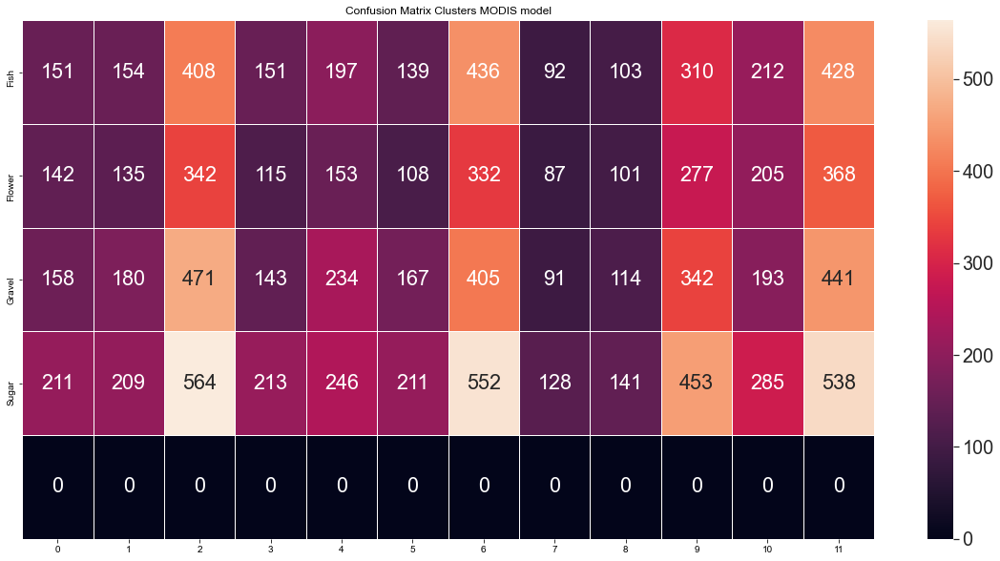

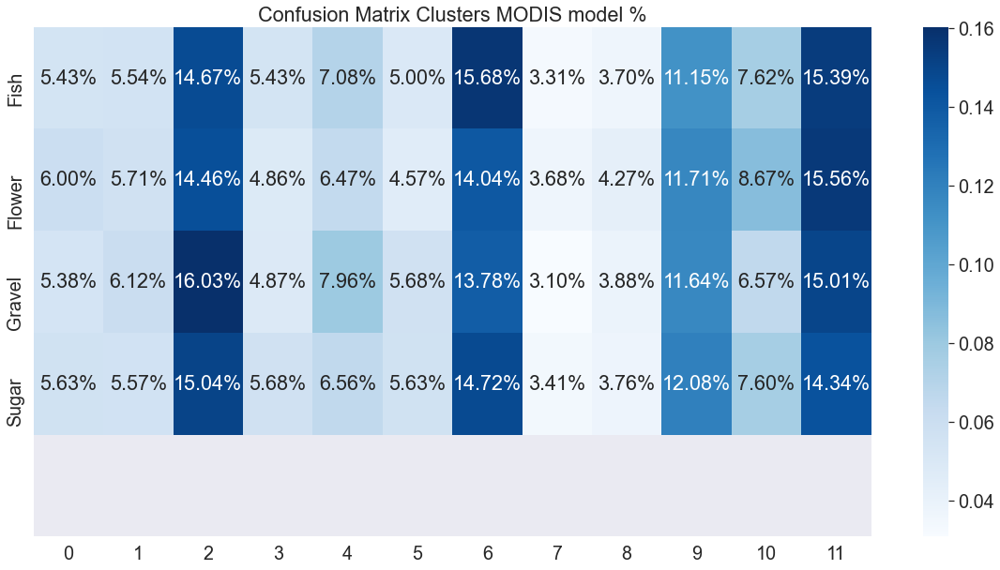

In [13]:
import seaborn as sns
from sklearn.metrics.cluster import normalized_mutual_info_score

print(normalized_mutual_info_score(labels, labs))

associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(20,10)) 
plt.title("Confusion Matrix Clusters MODIS model")
sns.set(font_scale=1.8)
sns.heatmap(cfs[:5], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs.shape)
print(   np.sum(  cfs, axis=1  ).shape  )
print(   (  cfs[:5].T/np.sum(cfs[:5], axis=1)    ).shape  )
plt.title("Confusion Matrix Clusters MODIS model %")
sns.heatmap( (cfs[:5].T/np.sum(cfs[:5], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

# Getting examples for each class

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]


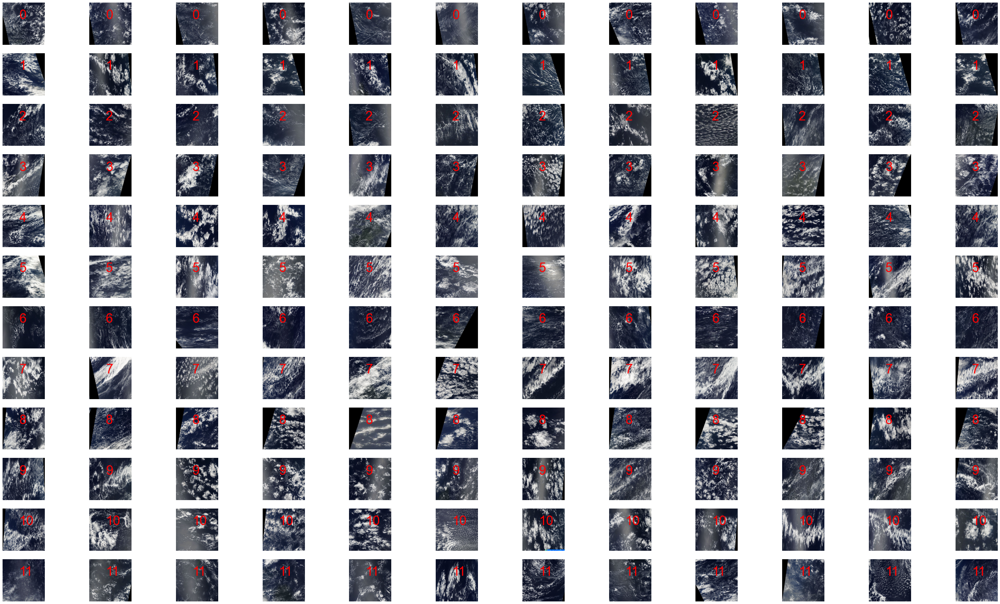

In [16]:
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms.functional as TF
import random
from os import listdir
from os.path import isfile, join

mypath = '/home/raysamram/DATASETS/ZOONIVERSE_RESIZED/train'

onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

w = 100
h = 200
fig = plt.figure(figsize=(50, 30))
columns = 12
rows = 12
predicted = []

i = 0
for classe in range(12):
    img_lbl = -1
    cnt = 0
    while cnt<columns:
        index = random.choice(onlyfiles)
        img_path = mypath+"/"+index
        image = Image.open(img_path)
        x = TF.to_tensor(image).unsqueeze(0)
        #print("shape img : "+str(x.shape))
        compressed = model.compress(x)[0].data.numpy()
        compressed = np.array([compressed], dtype=np.double)
        compressed = np.array(compressed, dtype=np.double)
        img_lbl = kmeans.predict(compressed.astype('double'))
        if img_lbl == classe:
            cnt += 1
            i += 1
            predicted.append(img_lbl[0])
            #print(img_lbl)
            fig.add_subplot(rows, columns, i)
            plt.imshow(image)
            plt.text(100, 100, str(img_lbl[0]), fontsize=35, color="red") #bbox=dict(fill=False, edgecolor='red', linewidth=2))
            plt.axis('off')
print(predicted)
fig.savefig('clustering_example.png', dpi=100)
plt.show()

# Examples of reconstructions

C:\Users\Ray\anaconda3\lib\site-packages\torch\nn\functional.py:1805: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


(3, 256, 256)
(3, 256, 256)
(3, 256, 256)
(3, 256, 256)
(3, 256, 256)
[]


<Figure size 3600x2160 with 0 Axes>

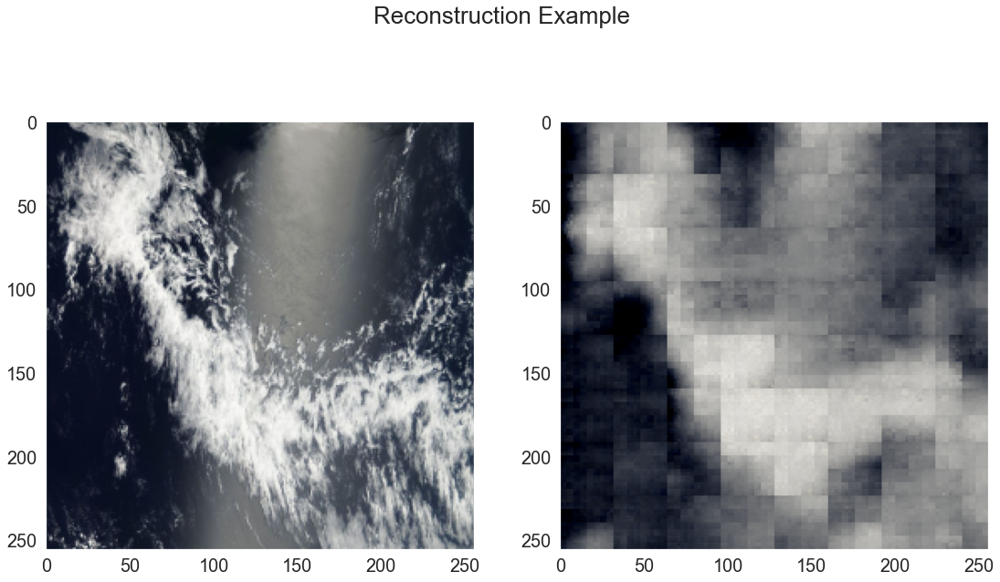

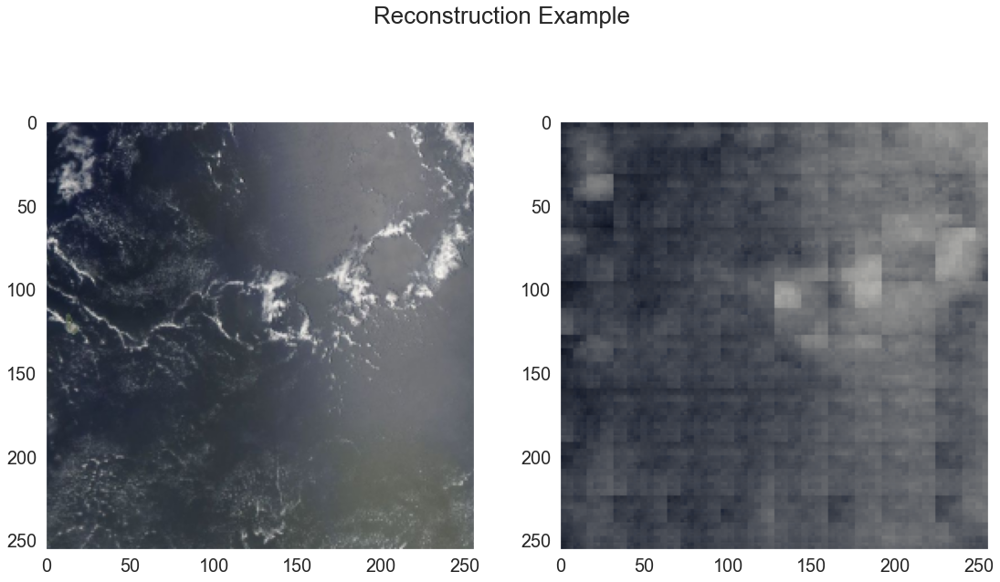

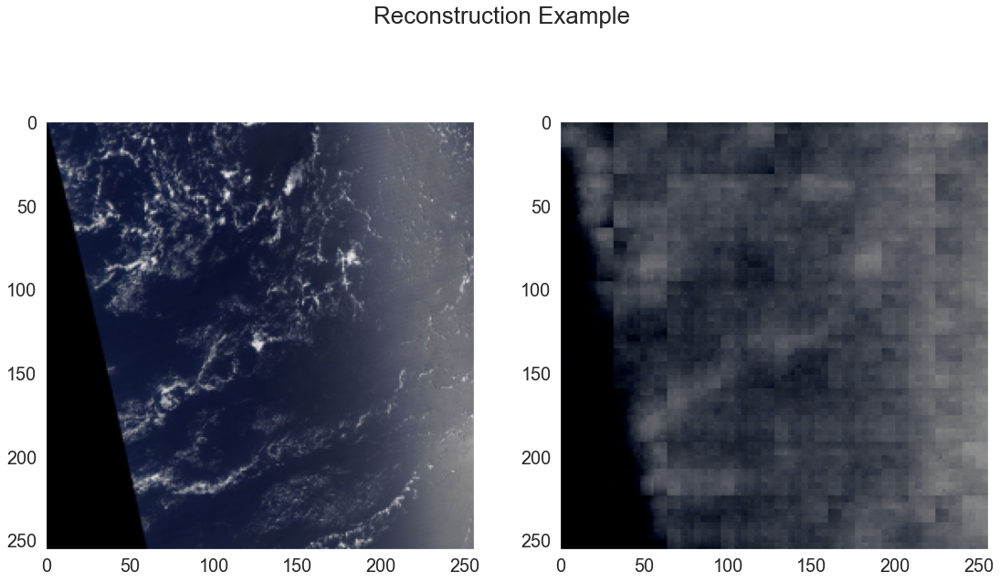

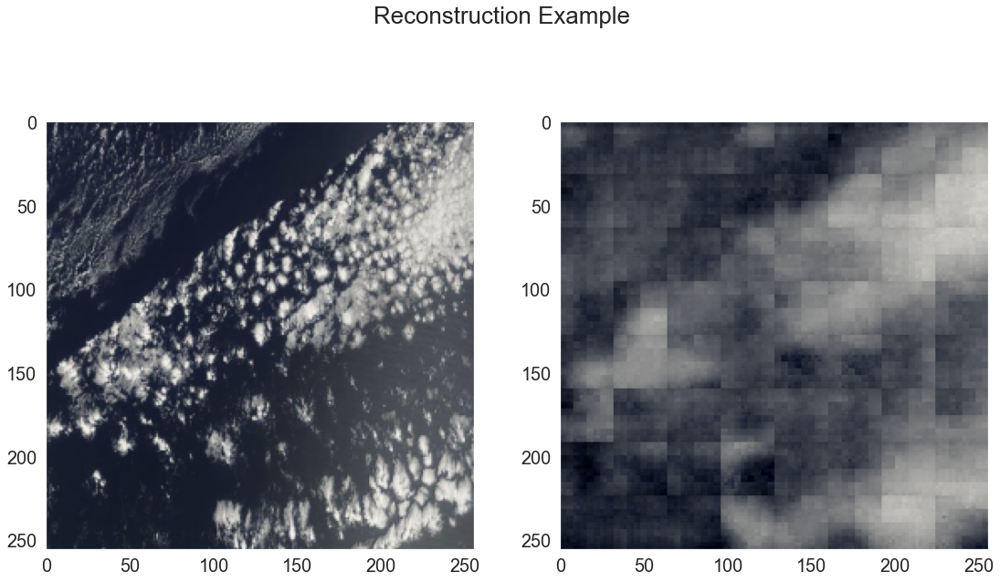

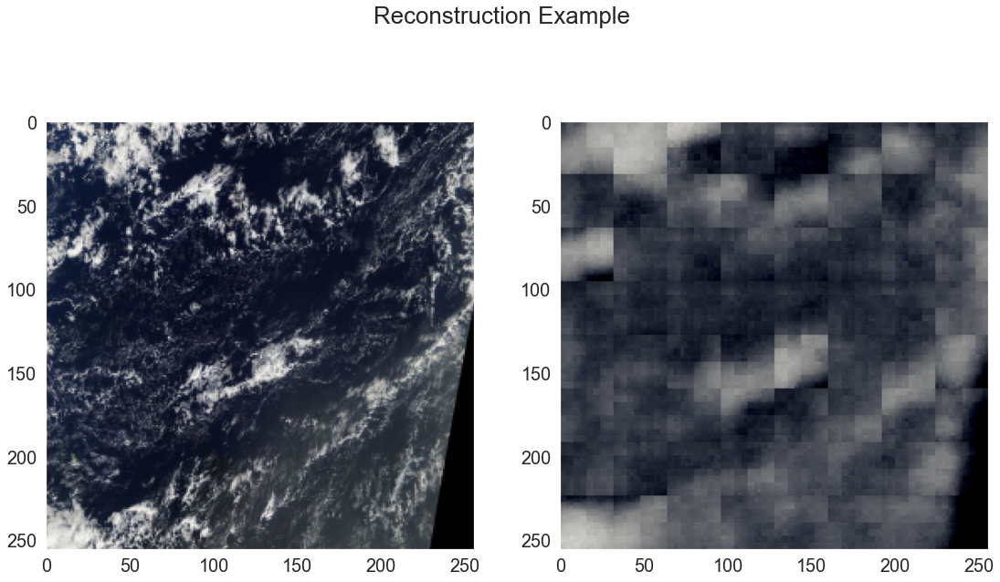

In [17]:
mypath = '/home/raysamram/DATASETS/ZOONIVERSE_RESIZED/train'

onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

w = 100
h = 100
fig = plt.figure(figsize=(50, 30))
columns = 12
rows = 5
predicted = []

#for i in range(1, columns*rows +1):
i = 0
for ex in range(5):
    index = random.choice(onlyfiles)
    img_path = mypath+"/"+index
    image = Image.open(img_path)
    x = TF.to_tensor(image).unsqueeze(0)
    reconstructed = model.forward(x)[0].data.numpy()
    print(reconstructed.shape)
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18.5, 10.5)
    fig.suptitle('Reconstruction Example')    
    ax1.grid(False)
    ax1.imshow(image)
    ax2.grid(False)
    reconstructed = np.transpose(reconstructed, (1, 2, 0))
    ax2.imshow(reconstructed)
    fig.savefig('test reconstructions/test_'+str(ex)+'png', dpi=100)
print(predicted)
plt.show()